In [1]:
import os,pickle,time,sys
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.image as mpimg
import matplotlib
from sklearn.preprocessing import MinMaxScaler
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import StandardScaler
from scipy.signal import medfilt
from torch.utils.data import DataLoader, TensorDataset
import optuna
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc, f1_score
import torch
import torch.optim as optim
import torch.nn.functional as F
import seaborn as sns
from scipy import signal

In [2]:
import pickle

# Function to load pickle files with debugging
def load_pickle(file_path):
    try:
        print(f"Loading: {file_path}")
        with open(file_path, 'rb') as f:
            return pickle.load(f)
    except Exception as e:
        print(f"Error loading {file_path}: {e}")
        return None

# Define file paths
path_afib_aflt = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_afib_aflt.pkl'
path_norm = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_norm.pkl'
path_y_afib_aflt = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_afib_aflt.pkl'
path_y_norm = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_norm.pkl'

# Load all files
X_afib_aflt = load_pickle(path_afib_aflt)
X_norm = load_pickle(path_norm)
Y_afib_aflt = load_pickle(path_y_afib_aflt)
Y_norm = load_pickle(path_y_norm)

# Print loaded data info
if X_afib_aflt is not None:
    print("X_afib_aflt:", type(X_afib_aflt), len(X_afib_aflt))
if X_norm is not None:
    print("X_norm:", type(X_norm), len(X_norm))
if Y_afib_aflt is not None:
    print("Y_afib_aflt:", type(Y_afib_aflt), len(Y_afib_aflt))
if Y_norm is not None:
    print("Y_norm:", type(Y_norm), len(Y_norm))


Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_afib_aflt.pkl
Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/X_norm.pkl
Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_afib_aflt.pkl
Loading: /home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/Y_norm.pkl
X_afib_aflt: <class 'numpy.ndarray'> 1570
X_norm: <class 'numpy.ndarray'> 9069
Y_afib_aflt: <class 'pandas.core.frame.DataFrame'> 1570
Y_norm: <class 'pandas.core.frame.DataFrame'> 9069


In [3]:
print("X_afib_aflt:", type(X_afib_aflt), len(X_afib_aflt))
print("X_norm:", type(X_norm), len(X_norm))
print("Y_afib_aflt:", type(Y_afib_aflt), len(Y_afib_aflt))
print("Y_norm:", type(Y_norm), len(Y_norm))

X_afib_aflt: <class 'numpy.ndarray'> 1570
X_norm: <class 'numpy.ndarray'> 9069
Y_afib_aflt: <class 'pandas.core.frame.DataFrame'> 1570
Y_norm: <class 'pandas.core.frame.DataFrame'> 9069


In [4]:
labels_norm = np.array([row for row in Y_norm['diagnostic_superclass']])

#  Randomly select 2000 samples
num_samples = 2000
random_indices = np.random.choice(len(X_norm), num_samples, replace=False)

norm_ecgs = X_norm[random_indices]
norm_labels = labels_norm[random_indices]


Y_afib_aflt = Y_afib_aflt[["diagnostic_superclass"]]
Y_afib_aflt["diagnostic_superclass"] = "AF"

Y_afib_aflt = Y_afib_aflt.to_numpy().reshape(-1, 1)
# Step 2: Concatenate the ECG signals
ecg_signals = np.concatenate((norm_ecgs, X_afib_aflt), axis=0)

# Step 3: Concatenate the ECG labels
ecgs_labels = np.concatenate((norm_labels, Y_afib_aflt), axis=0)

# Step 4: Verify the result
print(f"Combined ECG signals shape: {ecg_signals.shape}")
print(f"Combined labels shape: {ecgs_labels.shape}")

# Step 5: Check the first few signals and labels
print("Sample combined ECG signal (first entry):")
print(ecg_signals[0])
print("Sample combined label (first entry):")
print(ecgs_labels[0])

Combined ECG signals shape: (3570, 1000, 12)
Combined labels shape: (3570, 1)
Sample combined ECG signal (first entry):
[[-0.05  -0.025  0.025 ... -0.09  -0.065 -0.045]
 [-0.054 -0.025  0.029 ... -0.09  -0.065 -0.045]
 [-0.06  -0.025  0.035 ... -0.09  -0.065 -0.045]
 ...
 [-0.042 -0.112 -0.07  ...  0.019 -0.047 -0.053]
 [ 0.572  0.237 -0.335 ...  1.117  0.872  0.576]
 [ 0.759  0.404 -0.355 ...  1.267  1.12   0.855]]
Sample combined label (first entry):
['NORM']


In [5]:
# Use only Lead II (second column of ECG signals)
lead_II = ecg_signals[:, :, 1:2]  # Shape: (samples, timesteps, 1)

# Normalize
scaler = StandardScaler()
X_normalized = scaler.fit_transform(lead_II.reshape(-1, 1)).reshape(lead_II.shape)

# Median Filtering
window_size = 5
X_filtered = np.array([medfilt(x.squeeze(), kernel_size=window_size) for x in X_normalized])
X_filtered = X_filtered[..., np.newaxis]  # Reshape to (samples, timesteps, 1)

# Segment the signals
segment_length = 1000
X_segmented = np.array([
    x[i:i + segment_length] for x in X_filtered for i in range(0, len(x) - segment_length + 1, segment_length)
])
# Convert 'NORM' to 0 and 'AF' to 1
ecgs_labels_numeric = np.where(ecgs_labels == 'NORM', 0, 1)
from sklearn.model_selection import train_test_split

# Step 1: Split into training (64%) and temporary (36%) datasets
X_train, X_temp, y_train, y_temp = train_test_split(X_segmented, ecgs_labels_numeric, 
                                                    test_size=0.36, random_state=42, 
                                                    stratify=ecgs_labels)

# Step 2: Split the temporary dataset into validation (25%) and test (20%) datasets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, 
                                                test_size=0.5556, random_state=42, 
                                                stratify=y_temp)

# Step 3: Verify the class distributions in each dataset
print("Training set class distribution:", dict(zip(*np.unique(y_train, return_counts=True))))
print("Validation set class distribution:", dict(zip(*np.unique(y_val, return_counts=True))))
print("Test set class distribution:", dict(zip(*np.unique(y_test, return_counts=True))))

Training set class distribution: {0: 1280, 1: 1004}
Validation set class distribution: {0: 320, 1: 251}
Test set class distribution: {0: 400, 1: 315}


In [6]:
class ECGDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32).unsqueeze(1)  # Add channel dimension: (batch_size, 1, 1000, 1)
        self.y = torch.tensor(y, dtype=torch.long)  # Labels remain 1D with shape (batch_size, 1)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

# Creating the ECG datasets with reshaped input
train_dataset = ECGDataset(X_train, y_train)  # Shape (3570, 1000, 1) becomes (3570, 1, 1000, 1)
val_dataset = ECGDataset(X_val, y_val)
test_dataset = ECGDataset(X_test, y_test)

# Creating dataloaders
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

dataloaders = {
    'train': train_loader,
    'val': val_loader,
    'test': test_loader
}


In [26]:
def weights_init(mod):
    classname = mod.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.xavier_normal_(mod.weight.data)
    elif classname.find('BatchNorm') != -1:
        mod.weight.data.normal_(1.0, 0.02)
        mod.bias.data.fill_(0)
    elif classname.find('Linear') != -1:
        torch.nn.init.xavier_uniform_(mod.weight)
        mod.bias.data.fill_(0.01)

In [25]:
class Generator(nn.Module):
    def __init__(self, input_size, num_classes):
        super(Generator, self).__init__()
        self.input_size = input_size
        self.num_classes = num_classes
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        
        self.encoder = nn.Sequential(
            nn.Linear(input_size + num_classes, 256),
            nn.Tanh(),
            nn.Linear(256, 128),
            nn.Tanh(),
            nn.Linear(128, 32),
            nn.Tanh(),
            nn.Linear(32, 10),
        )
        self.decoder = nn.Sequential(
            nn.Linear(10, 32),
            nn.Tanh(),
            nn.Linear(32, 128),
            nn.Tanh(),
            nn.Linear(128, 256),
            nn.Tanh(),
            nn.Linear(256, input_size),
            nn.Tanh(),
        )

    def forward(self, input, labels=None):
        if labels is None:
            labels = torch.zeros(input.shape[0], dtype=torch.long).to(input.device)
        input = input.view(input.shape[0], -1)  # Flatten input
        labels = self.label_embedding(labels)

        # Flatten labels to (batch_size, num_classes)
        labels = labels.view(labels.size(0), -1)

        # Concatenate input and labels
        input_with_labels = torch.cat((input, labels), dim=1)
        z = self.encoder(input_with_labels)
        output = self.decoder(z)
        output = output.view(output.shape[0], 1000, 1)  # Reshape to original input shape
        return output


In [24]:
class Discriminator(nn.Module):
    def __init__(self, input_size, num_classes):
        super(Discriminator, self).__init__()
        self.input_size = input_size
        self.num_classes = num_classes
        self.label_embedding = nn.Embedding(num_classes, num_classes)
        
        self.features = nn.Sequential(
            nn.Linear(input_size + 1, 256),  # Modify here to match correct dimensions
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 256),
            nn.LeakyReLU(0.2, inplace=True)
        )
        self.classifier = nn.Sequential(
            nn.Linear(256, 1),
            nn.Sigmoid()
        )
        
    def forward(self, input, labels=None):
        if labels is None:
            labels = torch.zeros(input.shape[0], dtype=torch.long).to(input.device)

        # Flatten input from (batch_size, timesteps, channels) to (batch_size, timesteps × channels)
        input = input.view(input.shape[0], -1)
        
        # Ensure labels are properly flattened and resized
        labels = labels.view(labels.size(0), -1)  # Flatten labels to (batch_size, 1) if necessary
        
        # Concatenate input and labels
        input_with_labels = torch.cat((input, labels), dim=1)

        features = self.features(input_with_labels)
        classifier = self.classifier(features)
        classifier = classifier.view(-1, 1).squeeze(1)
        return classifier, features

In [23]:

def evaluate(y_true, y_scores):
    """
    Evaluate performance metrics.

    Parameters:
    - y_true: Ground truth labels (1D array).
    - y_scores: Anomaly scores (1D array).

    Returns:
    - rocprc: Area under the Precision-Recall Curve.
    - rocauc: Area under the ROC Curve.
    - best_th: Best threshold for the F1 score.
    - best_f1: Best F1 score.
    """
    # Ensure y_true and y_scores are numpy arrays
    y_true = np.array(y_true)
    y_scores = np.array(y_scores)

    # Compute ROC AUC
    rocauc = roc_auc_score(y_true, y_scores)

    # Compute Precision-Recall Curve and its AUC
    precision, recall, _ = precision_recall_curve(y_true, y_scores)
    rocprc = auc(recall, precision)

    # Compute the best threshold and F1 score
    thresholds = np.linspace(0, 1, 100)
    f1_scores = []
    for threshold in thresholds:
        # Use numpy's astype to cast to int for the binary predictions
        y_pred = (y_scores >= threshold).astype(np.int)
        f1 = f1_score(y_true, y_pred)
        f1_scores.append(f1)

    best_th = thresholds[np.argmax(f1_scores)]
    best_f1 = max(f1_scores)

    return rocprc, rocauc, best_th, best_f1

In [22]:
def temporal_coherence_loss(fake_data, real_data):
    if real_data.dim() > fake_data.dim():
        real_data = real_data.squeeze(1)  # Remove the singleton dimension at index 1
    
    # Ensure the fake_data and real_data have the same number of time steps
    min_length = min(fake_data.size(1), real_data.size(1))  # Use the min time length
    fake_data = fake_data[:, :min_length, :]  # Trim fake_data along the time axis
    real_data = real_data[:, :min_length, :]  # Trim real_data along the time axis

    # Ensure both tensors have non-zero length along the time axis
    if fake_data.size(1) == 0 or real_data.size(1) == 0:
        raise ValueError("After trimming, one of the tensors has zero time steps.")
    
    # Compute the differences between consecutive time steps
    diff_fake = fake_data[:, 1:, :] - fake_data[:, :-1, :]
    diff_real = real_data[:, 1:, :] - real_data[:, :-1, :]

    return torch.mean(torch.abs(diff_fake - diff_real))

def calculate_statistics(data):
    """
    Calculate the mean and covariance of the data.

    Parameters:
    - data (Tensor): The input data (e.g., fake_data or real_data)

    Returns:
    - mean (Tensor): The mean of the data
    - covariance (Tensor): The covariance matrix of the data
    """
    flattened_data = data.view(data.size(0), -1)  # Flatten the data
    mean = flattened_data.mean(dim=0)  # Mean along the batch dimension
    covariance = torch.cov(flattened_data.T)  # Covariance matrix along features
    return mean, covariance

def compute_fid(fake_data, real_data, eps=1e-8):
    # Compute statistics (mean and covariance) for both real and fake data
    real_mean, real_cov = calculate_statistics(real_data)
    fake_mean, fake_cov = calculate_statistics(fake_data)
    
    # Regularize covariance matrices to make them positive semi-definite
    real_cov += torch.eye(real_cov.size(0), device=real_cov.device) * eps
    fake_cov += torch.eye(fake_cov.size(0), device=fake_cov.device) * eps
    
    # Compute the FID score using the formula
    diff_mean = fake_mean - real_mean
    
    # Compute the square root of the product of the covariance matrices using eigen decomposition
    eigvals_real, eigvecs_real = torch.linalg.eigh(real_cov)
    eigvals_fake, eigvecs_fake = torch.linalg.eigh(fake_cov)
    
    # Check for any NaN values in the eigenvalues and replace them with zeros if necessary
    eigvals_real = torch.clamp(eigvals_real, min=0.0)  # Remove any negative eigenvalues
    eigvals_fake = torch.clamp(eigvals_fake, min=0.0)  # Remove any negative eigenvalues
    
    # Compute the square root of the eigenvalues
    sqrt_eigvals_real = torch.sqrt(eigvals_real + eps)
    sqrt_eigvals_fake = torch.sqrt(eigvals_fake + eps)
    
    # Compute the square root of the covariance matrix (this is the matrix square root approximation)
    cov_sqrt = eigvecs_real @ torch.diag(sqrt_eigvals_real) @ eigvecs_real.T + eigvecs_fake @ torch.diag(sqrt_eigvals_fake) @ eigvecs_fake.T
    
    # Calculate FID score
    fid_score = torch.norm(diff_mean) ** 2 + torch.trace(real_cov + fake_cov - 2.0 * cov_sqrt)
    
    # Prevent negative values (due to numerical errors)
    fid_score = torch.clamp(fid_score, min=0.0)
    
    return fid_score + eps  # Add small epsilon to avoid NaNs

def feature_matching_loss(fake_data, real_data, D):
    # Extract the feature vectors from the discriminator outputs 
    real_features, _ = D(real_data)
    fake_features, _ = D(fake_data)
    
    # Ensure real_features and fake_features are tensors, and compute the feature matching loss
    return torch.mean(torch.abs(real_features - fake_features))


In [27]:
def calculate_metrics(real_data, fake_data, labels, device, D):
    """
    Calculate evaluation metrics to compare real and fake data.

    Parameters:
    - real_data: Ground truth data (tensor or array).
    - fake_data: Generated data (tensor or array).
    - labels: Ground truth labels.
    - device: The device to move tensors to (e.g., "cuda" or "cpu").
    - D: Discriminator (for feature loss).

    Returns:
    - metrics: A dictionary of calculated metrics (AUC diff, correlation, mean, SD, FID).
    """
    # Ensure data is a PyTorch tensor
    if not isinstance(real_data, torch.Tensor):
        real_data = torch.tensor(real_data).to(device)
    if not isinstance(fake_data, torch.Tensor):
        fake_data = torch.tensor(fake_data).to(device)
    
    # Convert data to float if it's not already
    real_data = real_data.to(torch.float32)
    fake_data = fake_data.to(torch.float32)
    
    # Ensure tensors are in the correct shape for the metrics calculation
    real_data = real_data.view(real_data.size(0), -1)  # Flatten all dimensions except batch size
    fake_data = fake_data.view(fake_data.size(0), -1)  # Flatten all dimensions except batch size

    assert isinstance(real_data, torch.Tensor), "real_data must be a PyTorch Tensor."
    assert isinstance(fake_data, torch.Tensor), "fake_data must be a PyTorch Tensor."
    
    # Ensure both tensors have the same shape
    assert real_data.size(0) == fake_data.size(0), "Batch sizes of real and fake data do not match."
    
    # Ensure that fake_data has the same number of features as real_data (e.g., both 1000)
    if fake_data.size(1) != real_data.size(1):
        # Reshape or repeat fake_data to match real_data's number of features
        fake_data = fake_data.repeat(1, real_data.size(1))  # Repeat fake data along the feature axis
    
    # Calculate metrics such as AUC, correlation, and mean
    auc_diff = torch.abs(real_data.mean() - fake_data.mean()).item()
    
    # Flatten the tensors for correlation calculation
    real_data_flat = real_data.view(-1)
    fake_data_flat = fake_data.view(-1)

    # Check that the flattened tensors have the same size
    assert real_data_flat.size(0) == fake_data_flat.size(0), "Flattened tensors have mismatched sizes."

    # Calculate correlation
    correlation = torch.corrcoef(torch.stack([real_data_flat, fake_data_flat]))[0, 1].item()
    
    real_mean = real_data.mean().item()
    fake_mean = fake_data.mean().item()

    # Compute the FID loss
    fid_loss = compute_fid(fake_data, real_data)

    # Return the metrics as a dictionary
    metrics = {
        "auc_diff": auc_diff,
        "correlation": correlation,
        "real_mean": real_mean,
        "fake_mean": fake_mean,
        "fid_loss": fid_loss.item(),  # Convert the tensor to a scalar value
    }

    return metrics

In [23]:
'''
class BeatGAN_MOCAP:
    def __init__(self, dataloaders, device):
        self.dataloaders = dataloaders
        self.device = device
        self.batchsize = 64
        self.niter = 30
        self.lr = 0.00001
        self.beta1 = 0.9
        self.cur_epoch = 0

        input_size = 1000  # Updated for single-lead ECG
        num_classes = 2  # Assuming binary classification: 0 or 1
        self.G = Generator(input_size, num_classes).to(self.device)
        self.G.apply(weights_init)
        
        # Initialize the Improved Discriminator
        self.D = Discriminator(input_size, num_classes).to(self.device)
        self.D.apply(weights_init)

        # Loss Functions
        self.bce_criterion = nn.BCELoss()
        self.l1_criterion = nn.L1Loss()
        self.mse_criterion = nn.MSELoss()

        # Optimizers with weight decay for regularization
        self.optimizerD = optim.Adam(self.D.parameters(), lr=self.lr, betas=(self.beta1, 0.999), weight_decay=1e-5)
        self.optimizerG = optim.Adam(self.G.parameters(), lr=self.lr, betas=(self.beta1, 0.999), weight_decay=1e-5)

        # Learning rate scheduler
        self.schedulerD = optim.lr_scheduler.ReduceLROnPlateau(self.optimizerD, mode='min', factor=0.5, patience=5, verbose=True)
        self.schedulerG = optim.lr_scheduler.ReduceLROnPlateau(self.optimizerG, mode='min', factor=0.5, patience=5, verbose=True)

        self.total_steps = 0
        self.cur_epoch = 0

        self.real_label = 1
        self.fake_label = 0

        # -- Discriminator attributes
        self.err_d_real = None
        self.err_d_fake = None

        # -- Generator attributes
        self.err_g = None

        # Initialize a dictionary to store the losses and metrics
        self.train_hist = {
            'D_loss': [],
            'G_loss': [],
            'real_means': [],
            'fake_means': [],
            'correlations': [],
            'auc_diffs': [],
            'temporal_losses': [],
            'fid_losses': [],
            'feature_losses': []
        }
        
    def train_epoch(self):
        self.G.train()
        self.D.train()

        epoch_d_loss = 0.0
        epoch_g_loss = 0.0
        num_batches = 0
        metrics_summary = {
            "auc_diff": 0.0,
            "correlation": 0.0,
            "real_mean": 0.0,
            "fake_mean": 0.0,
            "temporal_loss": 0.0,
            "fid_loss": 0.0,
            "feature_loss": 0.0
        }

        for train_x, train_y in self.dataloaders["train"]:
            train_x, train_y = train_x.to(self.device), train_y.to(self.device)
            batch_size = train_x.shape[0]

            ## Train Discriminator
            self.optimizerD.zero_grad()
            out_d_real, _ = self.D(train_x, train_y)
            fake_data = self.G(train_x, train_y).detach()
            fake_data_flat = fake_data.view(fake_data.size(0), -1)
            out_d_fake, _ = self.D(fake_data_flat, train_y)

            # Losses
            err_d_real = self.bce_criterion(out_d_real, torch.full((batch_size,), 0.9, device=self.device))
            err_d_fake = self.bce_criterion(out_d_fake, torch.full((batch_size,), 0.1, device=self.device))
            err_d = err_d_real + err_d_fake
            err_d.backward()
            self.optimizerD.step()

            ## Train Generator
            self.optimizerG.zero_grad()
            fake_data = self.G(train_x, train_y)
            fake_data_flat = fake_data.view(fake_data.size(0), -1)
            _, feat_fake = self.D(fake_data_flat, train_y)
            _, feat_real = self.D(train_x.view(train_x.size(0), -1), train_y)

            # Generator losses
            err_g_adv = self.mse_criterion(feat_fake, feat_real)
            err_g_rec = self.mse_criterion(fake_data_flat, train_x.view(train_x.size(0), -1))
            err_g = err_g_rec + 0.01 * err_g_adv
            err_g.backward()
            self.optimizerG.step()

            # Compute additional losses like temporal coherence, FID, and feature matching
            temporal_loss = temporal_coherence_loss(fake_data, train_x)  # Placeholder loss
            fid_loss = compute_fid(fake_data, train_x)  # Placeholder FID loss
            feature_loss = feature_matching_loss(fake_data, train_x, self.D)  # Placeholder feature loss

            # Add to metrics
            metrics = calculate_metrics(train_x, fake_data, train_y, self.device, self.D)
            for key in metrics_summary:
                metrics_summary[key] += metrics.get(key, 0.0)
            metrics_summary["temporal_loss"] += temporal_loss.item()
            metrics_summary["fid_loss"] += fid_loss.item()
            metrics_summary["feature_loss"] += feature_loss.item()

            # Accumulate losses
            epoch_d_loss += err_d.item()
            epoch_g_loss += err_g.item()
            num_batches += 1

            # Store real and fake means, correlations, and auc_diff
            self.train_hist['real_means'].append(metrics["real_mean"])
            self.train_hist['fake_means'].append(metrics["fake_mean"])
            self.train_hist['correlations'].append(metrics["correlation"])
            self.train_hist['auc_diffs'].append(metrics["auc_diff"])        

        avg_metrics = {key: value / num_batches for key, value in metrics_summary.items()}
        print(f"Metrics: {avg_metrics}")

        # Average the losses for the epoch
        avg_d_loss = epoch_d_loss / num_batches
        avg_g_loss = epoch_g_loss / num_batches
        self.train_hist['D_loss'].append(avg_d_loss)
        self.train_hist['G_loss'].append(avg_g_loss)
        self.train_hist['fid_losses'].append(fid_loss)
        self.train_hist['temporal_losses'].append(temporal_loss)

        print(f"Epoch {self.cur_epoch}: D_loss: {avg_d_loss:.4f}, G_loss: {avg_g_loss:.4f}")

        # Update the learning rate using scheduler
        self.schedulerD.step(avg_d_loss)
        self.schedulerG.step(avg_g_loss)

        self.cur_epoch += 1
        return avg_metrics  # Return average metrics for logging
    

    def validate(self):
        self.G.eval()  # Set the generator to evaluation mode
        all_metrics = {"auc_diff": 0.0, "correlation": 0.0, "real_mean": 0.0, "fake_mean": 0.0}
        num_batches = 0

        for val_x, val_y in self.dataloaders["val"]:
            val_x, val_y = val_x.to(self.device), val_y.to(self.device)
        
            with torch.no_grad():
                fake_data = self.G(val_x, val_y)  # Generate fake data with the model
        
            # Calculate metrics using the calculate_metrics function
            metrics = calculate_metrics(val_x, fake_data, val_y, self.device, self.D)
        
            # Add metrics to the all_metrics dictionary
            for key in all_metrics:
                all_metrics[key] += metrics[key]
        
            num_batches += 1  # Average the metrics
        avg_metrics = {key: value / num_batches for key, value in all_metrics.items()}
        print(f"Validation Metrics: {avg_metrics}")
    
        return [avg_metrics]

    def predict(self, dataloader_, scale=True):
        self.G.eval()  # Set the generator to evaluation mode
        num_samples = len(dataloader_.dataset)  # Get total number of samples in the dataloader
        self.an_scores = torch.zeros(num_samples, dtype=torch.float32, device=self.device)  # Initialize anomaly scores tensor
        self.gt_labels = torch.zeros(num_samples, dtype=torch.long, device=self.device)  # Initialize ground truth labels tensor
        start_idx = 0  # Start index for batch processing

        with torch.no_grad():  # Disable gradient calculation during inference
            for data in dataloader_:
                test_x, test_y = data  # Get the test features and labels
                test_x, test_y = test_x.to(self.device), test_y.to(self.device)  # Move data to device

                # Generate fake data from the model
                fake = self.G(test_x, test_y)
                # Compute reconstruction error (MSE loss between the input and generated data)
                error = torch.mean((test_x.view(test_x.size(0), -1) - fake.view(fake.size(0), -1)) ** 2, dim=1)

                batch_size = test_x.size(0)
                end_idx = start_idx + batch_size  # Determine the end index of the current batch

                # Ensure test_y is 1D (flatten if needed)
                if test_y.dim() > 1:
                    test_y = test_y.view(-1)

            # Boundary check to avoid out-of-bounds errors
                end_idx = min(end_idx, num_samples)

                # Assign errors and labels to the respective tensors
                self.an_scores[start_idx:end_idx] = error.cpu()
                self.gt_labels[start_idx:end_idx] = test_y.cpu()

                start_idx = end_idx  # Update the start index for the next batch

    # Optionally, scale the anomaly scores using MinMaxScaler
        if scale:
            scaler = MinMaxScaler()
            self.an_scores = torch.tensor(
            scaler.fit_transform(self.an_scores.cpu().numpy().reshape(-1, 1)).reshape(-1),
            device=self.device
            )

        # Return the ground truth labels and the anomaly scores
        return self.gt_labels.cpu().numpy(), self.an_scores.cpu().numpy()




In [15]:


class BeatGAN_MOCAP:
    def __init__(self, dataloaders, device):
        self.dataloaders = dataloaders
        self.device = device
        self.batchsize = 64
        self.niter = 3000
        self.lr = 0.00001
        self.beta1 = 0.9
        self.cur_epoch = 0

        input_size = 1000  # Updated for single-lead ECG
        num_classes = 2  # Assuming binary classification: 0 or 1
        self.G = Generator(input_size, num_classes).to(self.device)
        self.G.apply(weights_init)

        self.D = Discriminator(input_size, num_classes).to(self.device)
        self.D.apply(weights_init)

        # Loss Functions
        self.bce_criterion = nn.BCELoss()
        self.l1_criterion = nn.L1Loss()
        self.mse_criterion = nn.MSELoss()

        # Optimizers with weight decay for regularization
        self.optimizerD = optim.Adam(self.D.parameters(), lr=self.lr, betas=(self.beta1, 0.999), weight_decay=1e-5)
        self.optimizerG = optim.Adam(self.G.parameters(), lr=self.lr, betas=(self.beta1, 0.999), weight_decay=1e-5)

        # Learning rate scheduler
        self.schedulerD = optim.lr_scheduler.ReduceLROnPlateau(self.optimizerD, mode='min', factor=0.5, patience=5, verbose=True)
        self.schedulerG = optim.lr_scheduler.ReduceLROnPlateau(self.optimizerG, mode='min', factor=0.5, patience=5, verbose=True)

        self.total_steps = 0
        self.cur_epoch = 0

        self.real_label = 1
        self.fake_label = 0

        # Initialize a dictionary to store the losses and metrics
        self.train_hist = {
            'D_loss': [],
            'G_loss': [],
            'real_means': [],
            'fake_means': [],
            'correlations': [],
            'auc_diffs': [],
            'temporal_losses': [],
            'fid_losses': [],
            'feature_losses': []
        }

    
    def train_epoch(self):
        self.G.train()
        self.D.train()

        epoch_d_loss = 0.0
        epoch_g_loss = 0.0
        num_batches = 0
        metrics_summary = {
            "auc_diff": 0.0,
            "correlation": 0.0,
            "real_mean": 0.0,
            "fake_mean": 0.0,
            "temporal_loss": 0.0,
            "fid_loss": 0.0,
            "feature_loss": 0.0
            }
        for train_x, train_y in self.dataloaders["train"]:
            train_x, train_y = train_x.to(self.device), train_y.to(self.device)
            batch_size = train_x.shape[0]

            # Train Discriminator
            self.optimizerD.zero_grad()
            out_d_real, _ = self.D(train_x, train_y)
            fake_data = self.G(train_x, train_y).detach()
            fake_data_flat = fake_data.view(fake_data.size(0), -1)
            out_d_fake, _ = self.D(fake_data_flat, train_y)

            err_d_real = self.bce_criterion(out_d_real, torch.full((batch_size,), 0.9, device=self.device))
            err_d_fake = self.bce_criterion(out_d_fake, torch.full((batch_size,), 0.1, device=self.device))
            err_d = err_d_real + err_d_fake
            err_d.backward()
            self.optimizerD.step()

            # Train Generator
            self.optimizerG.zero_grad()
            fake_data = self.G(train_x, train_y)
            fake_data_flat = fake_data.view(fake_data.size(0), -1)
            _, feat_fake = self.D(fake_data_flat, train_y)
            _, feat_real = self.D(train_x.view(train_x.size(0), -1), train_y)

            err_g_adv = self.mse_criterion(feat_fake, feat_real)
            err_g_rec = self.mse_criterion(fake_data_flat, train_x.view(train_x.size(0), -1))
            err_g = err_g_rec + 0.01 * err_g_adv
            err_g.backward()
            self.optimizerG.step()

            # Compute additional losses
            temporal_loss = temporal_coherence_loss(fake_data, train_x)
            fid_loss = compute_fid(fake_data, train_x)
            feature_loss = feature_matching_loss(fake_data, train_x, self.D)

            # Update metrics
            metrics = calculate_metrics(train_x, fake_data, train_y, self.device, self.D)
            for key in metrics_summary:
                metrics_summary[key] += metrics.get(key, 0.0)
            metrics_summary["temporal_loss"] += temporal_loss.item()
            metrics_summary["fid_loss"] += fid_loss.item()
            metrics_summary["feature_loss"] += feature_loss.item()

            epoch_d_loss += err_d.item()
            epoch_g_loss += err_g.item()
            num_batches += 1

            # Append metrics for each batch
            self.train_hist['real_means'].append(metrics["real_mean"])
            self.train_hist['fake_means'].append(metrics["fake_mean"])
            self.train_hist['correlations'].append(metrics["correlation"])
            self.train_hist['auc_diffs'].append(metrics["auc_diff"])

        avg_metrics = {key: value / num_batches for key, value in metrics_summary.items()}

        # Calculate average generator and discriminator losses
        avg_d_loss = epoch_d_loss / num_batches
        avg_g_loss = epoch_g_loss / num_batches

        # Print the generator and discriminator losses along with metrics after each epoch
        print(f"Epoch {self.cur_epoch} - D Loss: {avg_d_loss:.4f}, G Loss: {avg_g_loss:.4f}")
        print(f"Metrics: {avg_metrics}")

        # Record the losses and metrics in the training history
        self.train_hist['D_loss'].append(avg_d_loss)
        self.train_hist['G_loss'].append(avg_g_loss)
        self.train_hist['fid_losses'].append(avg_metrics["fid_loss"])
        self.train_hist['temporal_losses'].append(avg_metrics["temporal_loss"])
        self.train_hist['feature_losses'].append(avg_metrics["feature_loss"])

        self.schedulerD.step(avg_d_loss)
        self.schedulerG.step(avg_g_loss)

        self.cur_epoch += 1
        return avg_metrics

    

          
    def validate(self):
        self.G.eval()
        all_metrics = {"auc_diff": 0.0, "correlation": 0.0, "real_mean": 0.0, "fake_mean": 0.0}
        num_batches = 0

        for val_x, val_y in self.dataloaders["val"]:
            val_x, val_y = val_x.to(self.device), val_y.to(self.device)

            with torch.no_grad():
                fake_data = self.G(val_x, val_y)

            metrics = calculate_metrics(val_x, fake_data, val_y, self.device, self.D)
            for key in all_metrics:
                all_metrics[key] += metrics[key]

            num_batches += 1

        avg_metrics = {key: value / num_batches for key, value in all_metrics.items()}
        print(f"Validation Metrics: {avg_metrics}")

        return avg_metrics

    def predict(self, dataloader_, scale=True):
        self.G.eval()
        num_samples = len(dataloader_.dataset)
        self.an_scores = torch.zeros(num_samples, dtype=torch.float32, device=self.device)
        self.gt_labels = torch.zeros(num_samples, dtype=torch.long, device=self.device)
        start_idx = 0

        with torch.no_grad():
            for data in dataloader_:
                test_x, test_y = data
                test_x, test_y = test_x.to(self.device), test_y.to(self.device)
                fake = self.G(test_x, test_y)
                error = torch.mean((test_x.view(test_x.size(0), -1) - fake.view(fake.size(0), -1)) ** 2, dim=1)

                batch_size = test_x.size(0)
                end_idx = start_idx + batch_size
                end_idx = min(end_idx, num_samples)

                self.an_scores[start_idx:end_idx] = error.cpu()
                self.gt_labels[start_idx:end_idx] = test_y.view(-1).cpu()

                start_idx = end_idx

        if scale:
            scaler = MinMaxScaler()
            self.an_scores = torch.tensor(
                scaler.fit_transform(self.an_scores.cpu().numpy().reshape(-1, 1)).reshape(-1),
                device=self.device
            )

        return self.gt_labels.cpu().numpy(), self.an_scores.cpu().numpy()


In [17]:
def mycalculate_metrics_skip_fid(real_data, fake_data, labels, device, D):
    """
    Calculate evaluation metrics to compare real and fake data, skipping FID calculation.

    Parameters:
    - real_data: Ground truth data (tensor or array).
    - fake_data: Generated data (tensor or array).
    - labels: Ground truth labels.
    - device: The device to move tensors to (e.g., "cuda" or "cpu").
    - D: Discriminator (for feature loss, if needed for other metrics).

    Returns:
    - metrics: A dictionary of calculated metrics (AUC diff, correlation, mean).
    """
    # Ensure data is a PyTorch tensor
    if not isinstance(real_data, torch.Tensor):
        real_data = torch.tensor(real_data).to(device)
    if not isinstance(fake_data, torch.Tensor):
        fake_data = torch.tensor(fake_data).to(device)
    
    # Convert data to float if it's not already
    real_data = real_data.to(torch.float32)
    fake_data = fake_data.to(torch.float32)
    
    # Ensure tensors are in the correct shape for the metrics calculation
    real_data = real_data.view(real_data.size(0), -1)  # Flatten all dimensions except batch size
    fake_data = fake_data.view(fake_data.size(0), -1)  # Flatten all dimensions except batch size

    assert isinstance(real_data, torch.Tensor), "real_data must be a PyTorch Tensor."
    assert isinstance(fake_data, torch.Tensor), "fake_data must be a PyTorch Tensor."
    
    # Ensure both tensors have the same shape
    assert real_data.size(0) == fake_data.size(0), "Batch sizes of real and fake data do not match."
    
    # Ensure that fake_data has the same number of features as real_data (e.g., both 1000)
    if fake_data.size(1) != real_data.size(1):
        # Reshape or repeat fake_data to match real_data's number of features
        fake_data = fake_data.repeat(1, real_data.size(1))  # Repeat fake data along the feature axis

    # Calculate metrics such as AUC, correlation, and mean
    auc_diff = torch.abs(real_data.mean() - fake_data.mean()).item()
    
    # Flatten the tensors for correlation calculation
    real_data_flat = real_data.view(-1)
    fake_data_flat = fake_data.view(-1)

    # Calculate correlation
    correlation = torch.corrcoef(torch.stack([real_data_flat, fake_data_flat]))[0, 1].item()
    
    real_mean = real_data.mean().item()
    fake_mean = fake_data.mean().item()

    # Return the metrics without FID loss
    metrics = {
        "auc_diff": auc_diff,
        "correlation": correlation,
        "real_mean": real_mean,
        "fake_mean": fake_mean,
    }

    return metrics


In [28]:
def plot_loss(history):
    """
    Plot discriminator and generator losses over training epochs.
    
    Parameters:
    - history: Dictionary containing training history with 'D_loss' and 'G_loss'.
    """
    plt.figure(figsize=(10, 5))
    
    # Plot D_loss and G_loss
    plt.plot(history['D_loss'], label='Discriminator Loss', color='red')
    plt.plot(history['G_loss'], label='Generator Loss', color='blue')
    
    plt.title('Discriminator and Generator Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()
    
def plot_fake_ecg_samples(generator, dataloader, device, num_samples=5):
    """
    Generate and plot fake ECG samples using the trained Generator.
    
    Parameters:
    - generator: The trained Generator model.
    - dataloader: DataLoader for the validation or test set.
    - device: The device to run the model on (e.g., 'cuda' or 'cpu').
    - num_samples: Number of samples to plot.
    """
    generator.eval()  # Set the generator to evaluation mode
    data_iter = iter(dataloader)
    real_data, real_labels = next(data_iter)

    # Generate fake ECG samples
    fake_data = generator(real_data.to(device), real_labels.to(device))

    # Select a few samples to plot
    for i in range(num_samples):
        plt.figure(figsize=(10, 4))

        # Squeeze the dimensions of the real data and fake data to 1D (1000,)
        real_ecg = real_data[i].squeeze().cpu().numpy()  # Remove extra dimensions
        fake_ecg = fake_data[i].squeeze().cpu().detach().numpy()  # Remove extra dimensions

        plt.plot(real_ecg, label="Real ECG")
        plt.plot(fake_ecg, label="Fake ECG", linestyle="--")
        plt.title(f"ECG Sample {i+1} - Label: {real_labels[i].item()}")
        plt.legend()
        plt.show()


def plot_correlation_heatmap(correlation_values):
    """
    Plot a heatmap to visualize the evolution of correlations between real and fake data
    across epochs.

    Parameters:
    - correlation_values: List of correlation coefficients for each epoch.
    """
    # Convert the correlation list into a numpy array (if it's not already)
    correlation_values = np.array(correlation_values)

    # Reshape the correlation values to a 2D matrix: (epochs, 1)
    correlation_matrix = correlation_values.reshape(-1, 1)

    # Plot the heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(correlation_matrix.T, cmap="coolwarm", annot=True, xticklabels=range(1, len(correlation_values)+1), yticklabels=["Correlation"])
    plt.xlabel("Epoch")
    plt.title("Heatmap of Correlation between Real and Fake Data Over Epochs")
    plt.show()

def plot_scatter_with_correlation(real_means, fake_means, correlations):
    """
    Plot a scatter plot showing the relationship between real and fake means, 
    with color indicating the correlation for each epoch.

    Parameters:
    - real_means: List of real means (calculated after each epoch).
    - fake_means: List of fake means (calculated after each epoch).
    - correlations: List of correlation values (calculated after each epoch).
    """
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(real_means, fake_means, c=correlations, cmap='coolwarm', s=100, edgecolor='black')
    plt.colorbar(scatter, label='Correlation')
    plt.xlabel("Real Data Mean")
    plt.ylabel("Fake Data Mean")
    plt.title("Real vs Fake Means with Correlation as Color")
    plt.show()



In [29]:

# Function to plot FID Loss and Temporal Loss
def plot_losses(train_hist):
    # Extract losses from the training history
    fid_losses = train_hist['fid_losses']
    temporal_losses = train_hist['temporal_losses']
    epochs = range(1, len(fid_losses) + 1)  # Epoch numbers

    # Create the plot
    plt.figure(figsize=(12, 6))

    # Plot FID Loss
    plt.plot(epochs, fid_losses, label='FID Loss', color='blue', marker='o', linestyle='-', linewidth=2)

    # Plot Temporal Loss
    plt.plot(epochs, temporal_losses, label='Temporal Loss', color='orange', marker='s', linestyle='--', linewidth=2)

    # Add titles and labels
    plt.title('FID Loss and Temporal Loss Over Training Epochs', fontsize=16)
    plt.xlabel('Epoch', fontsize=14)
    plt.ylabel('Loss', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(alpha=0.5)
    plt.tight_layout()

    # Show the plot
    plt.show()



In [30]:

# Ensure GPU is used if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

if torch.cuda.is_available():
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
else:
    print("No GPU available, using CPU.")

# Objective function with GPU support
def objective(trial):
    # Define hyperparameters to tune
    lr = trial.suggest_float("lr", 1e-5, 2e-4, log=True)
    beta1 = trial.suggest_float("beta1", 0.5, 0.9)
    dropout_rate = trial.suggest_float("dropout_rate", 0.3, 0.5)
    weight_decay = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)

    # Initialize the model on the correct device
    beatgan = BeatGAN_MOCAP(dataloaders, device)
    beatgan.lr = lr
    beatgan.beta1 = beta1
    beatgan.dropout_rate = dropout_rate
    beatgan.weight_decay = weight_decay

    # Training loop
    for epoch in range(beatgan.niter):
        beatgan.train_epoch()  # This trains on the specified device

    # Validation metrics
    real_labels, fake_scores = beatgan.predict(dataloaders["val"])
    real_data = dataloaders["val"].dataset.X.to(device)  # Ensure data is on the same device
    final_metrics = calculate_metrics(real_data, fake_scores, real_labels, device, beatgan.D) 

    # Composite metric
    composite_metric = (
        final_metrics["auc_diff"] + (1 - final_metrics["correlation"]) +
        abs(final_metrics["real_mean"] - final_metrics["fake_mean"])
    )

    # Print GPU memory usage during optimization
    if torch.cuda.is_available():
        print(f"Memory Allocated: {torch.cuda.memory_allocated(0) / 1e6:.2f} MB")
        print(f"Memory Reserved: {torch.cuda.memory_reserved(0) / 1e6:.2f} MB")

    return composite_metric

# Create and run the Optuna study
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=10)


[I 2024-12-11 09:25:36,160] A new study created in memory with name: no-name-8cd542b2-a67f-4d91-833b-0a6192a0af87


Using device: cuda
GPU Name: NVIDIA GeForce RTX 4090
Epoch 0 - D Loss: 1.4169, G Loss: 0.6476
Metrics: {'auc_diff': 0.04604140855371952, 'correlation': 0.002494129957792918, 'real_mean': -0.03658732927093903, 'fake_mean': 0.009454079256910417, 'temporal_loss': 0.1854654165605704, 'fid_loss': 606.2440456814236, 'feature_loss': 0.0727536113311847}
Epoch 1 - D Loss: 1.2986, G Loss: 0.6462
Metrics: {'auc_diff': 0.04575598260594739, 'correlation': 0.014857248868793249, 'real_mean': -0.03657885242460503, 'fake_mean': 0.009177129935576685, 'temporal_loss': 0.1807683143350813, 'fid_loss': 609.0684797498915, 'feature_loss': 0.0931538167513079}
Epoch 2 - D Loss: 1.2288, G Loss: 0.6444
Metrics: {'auc_diff': 0.04558145725685689, 'correlation': 0.02882080496702757, 'real_mean': -0.03665998283152779, 'fake_mean': 0.008921474244238602, 'temporal_loss': 0.17804069320360819, 'fid_loss': 609.8028513590494, 'feature_loss': 0.13787521235644817}
Epoch 3 - D Loss: 1.1857, G Loss: 0.6387
Metrics: {'auc_diff'

[I 2024-12-11 10:18:59,944] Trial 0 finished with value: 1.3675498235970736 and parameters: {'lr': 3.233280676611035e-05, 'beta1': 0.5920971023157032, 'dropout_rate': 0.34656764278358343, 'weight_decay': 0.00016489039063157375}. Best is trial 0 with value: 1.3675498235970736.


Epoch 2999 - D Loss: 0.6510, G Loss: 0.5014
Metrics: {'auc_diff': 0.013238689706971249, 'correlation': 0.4651753513349427, 'real_mean': -0.03649491946109467, 'fake_mean': -0.023960207278529804, 'temporal_loss': 0.1272979834013515, 'fid_loss': 681.8734893798828, 'feature_loss': 0.792532354593277}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.3673, G Loss: 0.6476
Metrics: {'auc_diff': 0.0464967865910795, 'correlation': 0.004096889815021616, 'real_mean': -0.03651706607908838, 'fake_mean': 0.00997972058960133, 'temporal_loss': 0.18853365629911423, 'fid_loss': 605.080318874783, 'feature_loss': 0.07396791844318311}
Epoch 1 - D Loss: 1.2632, G Loss: 0.6474
Metrics: {'auc_diff': 0.046253602848284774, 'correlation': 0.015710870567191806, 'real_mean': -0.03653552647059163, 'fake_mean': 0.009718076248342792, 'temporal_loss': 0.18295676385362944, 'fid_loss': 609.2573072645399, 'feature_loss': 0.10990468309157425}
Epoch 2 - D Loss: 1.2025, G Loss: 0.6423
Metrics: {'auc_diff': 0.04591149598773983, 'correlation': 0.028086288469947047, 'real_mean': -0.036453339685168534, 'fake_mean': 0.00945815617322094, 'temporal_loss': 0.17945066839456558, 'fid_loss': 604.1030769348145, 'feature_loss': 0.15941071179178026}
Epoch 3 - D Loss: 1.1634, G Loss: 0.6398
Metrics: {'auc_diff': 0.045795853353208966, 'correlation': 0.043391373

[I 2024-12-11 11:12:24,659] Trial 1 finished with value: 1.3663358353078365 and parameters: {'lr': 5.281306596096466e-05, 'beta1': 0.7611975642792963, 'dropout_rate': 0.47822392339536796, 'weight_decay': 5.299153234045843e-06}. Best is trial 1 with value: 1.3663358353078365.


Epoch 2999 - D Loss: 0.6507, G Loss: 0.5050
Metrics: {'auc_diff': 0.018080767839112215, 'correlation': 0.4615931262572606, 'real_mean': -0.03654588241544035, 'fake_mean': -0.019015101845272712, 'temporal_loss': 0.1276161608596643, 'fid_loss': 679.0425728691948, 'feature_loss': 0.7942346185445786}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.2791, G Loss: 0.6499
Metrics: {'auc_diff': 0.04681162991457515, 'correlation': -0.0022970654871541127, 'real_mean': -0.036663368396047086, 'fake_mean': 0.010148261415047778, 'temporal_loss': 0.18493960094120768, 'fid_loss': 610.9680023193359, 'feature_loss': 0.10682342035902871}
Epoch 1 - D Loss: 1.2005, G Loss: 0.6459
Metrics: {'auc_diff': 0.04603641647069404, 'correlation': 0.008279583747126808, 'real_mean': -0.03617917416462054, 'fake_mean': 0.009857242150853077, 'temporal_loss': 0.17865608549780315, 'fid_loss': 607.0657162136501, 'feature_loss': 0.16247632892595398}
Epoch 2 - D Loss: 1.1562, G Loss: 0.6433
Metrics: {'auc_diff': 0.04611274041235447, 'correlation': 0.018240338631181255, 'real_mean': -0.03653857114517854, 'fake_mean': 0.00957416918956571, 'temporal_loss': 0.17501039637459648, 'fid_loss': 606.328734503852, 'feature_loss': 0.21047098230984476}
Epoch 3 - D Loss: 1.1283, G Loss: 0.6416
Metrics: {'auc_diff': 0.04575145699911647, 'correlation': 0.0308880

[I 2024-12-11 12:06:21,728] Trial 2 finished with value: 1.3673012964427471 and parameters: {'lr': 8.93953534048649e-05, 'beta1': 0.7137964294345406, 'dropout_rate': 0.31618865273428265, 'weight_decay': 0.0005676117254432376}. Best is trial 1 with value: 1.3663358353078365.


Epoch 2999 - D Loss: 0.6508, G Loss: 0.5026
Metrics: {'auc_diff': 0.013910314430379205, 'correlation': 0.46590273992882836, 'real_mean': -0.03620866459742603, 'fake_mean': -0.023140444446148142, 'temporal_loss': 0.12668716286619505, 'fid_loss': 686.3139521280924, 'feature_loss': 0.7941257026460435}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.2941, G Loss: 0.6479
Metrics: {'auc_diff': 0.045958255572865404, 'correlation': 0.007267661311036338, 'real_mean': -0.03653853161570927, 'fake_mean': 0.009419724138246642, 'temporal_loss': 0.1909055933356285, 'fid_loss': 606.2739791870117, 'feature_loss': 0.09661068146427472}
Epoch 1 - D Loss: 1.2162, G Loss: 0.6441
Metrics: {'auc_diff': 0.045689349735362664, 'correlation': 0.018478688939164083, 'real_mean': -0.03661762653953499, 'fake_mean': 0.009071723247567812, 'temporal_loss': 0.1852486671672927, 'fid_loss': 603.6887452867296, 'feature_loss': 0.1529851146042347}
Epoch 2 - D Loss: 1.1732, G Loss: 0.6421
Metrics: {'auc_diff': 0.04534334016756879, 'correlation': 0.030790729137758415, 'real_mean': -0.03658443197814955, 'fake_mean': 0.008758908422249887, 'temporal_loss': 0.18162264095412362, 'fid_loss': 603.8830846150717, 'feature_loss': 0.19873914246757826}
Epoch 3 - D Loss: 1.1446, G Loss: 0.6382
Metrics: {'auc_diff': 0.04500007168907258, 'correlation': 0.044846495

[I 2024-12-11 12:59:45,874] Trial 3 finished with value: 1.366222072392702 and parameters: {'lr': 3.242406072181275e-05, 'beta1': 0.5945522519254998, 'dropout_rate': 0.4328875073991507, 'weight_decay': 0.0008518479731283483}. Best is trial 3 with value: 1.366222072392702.


Epoch 2999 - D Loss: 0.6507, G Loss: 0.5009
Metrics: {'auc_diff': 0.013274967722180817, 'correlation': 0.46699683119853336, 'real_mean': -0.0364764105502723, 'fake_mean': -0.023909664816326566, 'temporal_loss': 0.12580378539860249, 'fid_loss': 681.1471752590603, 'feature_loss': 0.7948877579636044}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.3032, G Loss: 0.6491
Metrics: {'auc_diff': 0.04626339420469271, 'correlation': 0.010389894541327117, 'real_mean': -0.03653327965488037, 'fake_mean': 0.009730114291111628, 'temporal_loss': 0.19471072653929392, 'fid_loss': 606.6905415852865, 'feature_loss': 0.08669503198729621}
Epoch 1 - D Loss: 1.2239, G Loss: 0.6444
Metrics: {'auc_diff': 0.04606226754064361, 'correlation': 0.024833616179724533, 'real_mean': -0.03655238726383282, 'fake_mean': 0.009509880199200578, 'temporal_loss': 0.18913542769021457, 'fid_loss': 603.901062435574, 'feature_loss': 0.1417582370340824}
Epoch 2 - D Loss: 1.1769, G Loss: 0.6430
Metrics: {'auc_diff': 0.04581509044186936, 'correlation': 0.04054440314778023, 'real_mean': -0.03651963577916225, 'fake_mean': 0.009295454947277904, 'temporal_loss': 0.18575023652778733, 'fid_loss': 606.9035907321506, 'feature_loss': 0.1892950033975972}
Epoch 3 - D Loss: 1.1444, G Loss: 0.6392
Metrics: {'auc_diff': 0.045702598782049283, 'correlation': 0.05820936130

[I 2024-12-11 13:53:10,626] Trial 4 finished with value: 1.3677513487637043 and parameters: {'lr': 5.769565032782613e-05, 'beta1': 0.5154558970090303, 'dropout_rate': 0.41182952066112416, 'weight_decay': 4.628651647518155e-05}. Best is trial 3 with value: 1.366222072392702.


Epoch 2999 - D Loss: 0.6510, G Loss: 0.5033
Metrics: {'auc_diff': 0.013910768812315332, 'correlation': 0.46355273409022224, 'real_mean': -0.03665689451413022, 'fake_mean': -0.02274612567594482, 'temporal_loss': 0.12543413560423586, 'fid_loss': 682.60876888699, 'feature_loss': 0.7941513607899348}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.4531, G Loss: 0.6489
Metrics: {'auc_diff': 0.04656510029195084, 'correlation': 0.00224335720566968, 'real_mean': -0.03656763141043484, 'fake_mean': 0.009997469114346636, 'temporal_loss': 0.19308488195141157, 'fid_loss': 605.0142932467991, 'feature_loss': 0.08093445830874973}
Epoch 1 - D Loss: 1.3114, G Loss: 0.6472
Metrics: {'auc_diff': 0.046150780748575926, 'correlation': 0.012291728428358005, 'real_mean': -0.036507387904243335, 'fake_mean': 0.00964339305129316, 'temporal_loss': 0.1869052569899294, 'fid_loss': 606.981547885471, 'feature_loss': 0.09298441590120395}
Epoch 2 - D Loss: 1.2305, G Loss: 0.6430
Metrics: {'auc_diff': 0.04587668273597956, 'correlation': 0.02177964231102831, 'real_mean': -0.03656827089273267, 'fake_mean': 0.009308411920857098, 'temporal_loss': 0.18264337504903475, 'fid_loss': 602.9723866780599, 'feature_loss': 0.1376910884347227}
Epoch 3 - D Loss: 1.1820, G Loss: 0.6416
Metrics: {'auc_diff': 0.045525050825542875, 'correlation': 0.03319899204

[I 2024-12-11 14:46:34,011] Trial 5 finished with value: 1.3662755023688078 and parameters: {'lr': 2.4067714270626025e-05, 'beta1': 0.7106517853750562, 'dropout_rate': 0.3797900644932567, 'weight_decay': 0.0001732058977398487}. Best is trial 3 with value: 1.366222072392702.


Epoch 2999 - D Loss: 0.6509, G Loss: 0.5098
Metrics: {'auc_diff': 0.014846087485137913, 'correlation': 0.4536014232370589, 'real_mean': -0.036546640136900045, 'fake_mean': -0.0221826018144687, 'temporal_loss': 0.13191128128932583, 'fid_loss': 676.8207914564344, 'feature_loss': 0.7925058768855201}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.4784, G Loss: 0.6471
Metrics: {'auc_diff': 0.04625583781550328, 'correlation': 0.0070376008952482355, 'real_mean': -0.03658930794335902, 'fake_mean': 0.009666529768663976, 'temporal_loss': 0.1795291474295987, 'fid_loss': 607.4003829956055, 'feature_loss': 0.07570156082510948}
Epoch 1 - D Loss: 1.3350, G Loss: 0.6438
Metrics: {'auc_diff': 0.04591423640441564, 'correlation': 0.019482966541545466, 'real_mean': -0.03658734756107959, 'fake_mean': 0.00932688886920611, 'temporal_loss': 0.17503444312347305, 'fid_loss': 606.4809400770399, 'feature_loss': 0.07951392129891449}
Epoch 2 - D Loss: 1.2496, G Loss: 0.6409
Metrics: {'auc_diff': 0.045553023719953165, 'correlation': 0.03397195258488258, 'real_mean': -0.0365376249473128, 'fake_mean': 0.009015398759705326, 'temporal_loss': 0.17255154459012878, 'fid_loss': 605.5546620686849, 'feature_loss': 0.12140781535870498}
Epoch 3 - D Loss: 1.1974, G Loss: 0.6379
Metrics: {'auc_diff': 0.04516216688272026, 'correlation': 0.0516087933

[I 2024-12-11 15:39:56,134] Trial 6 finished with value: 1.3663805704563856 and parameters: {'lr': 0.00017166321674291576, 'beta1': 0.7641727286697533, 'dropout_rate': 0.42585643206827367, 'weight_decay': 6.280564439353191e-06}. Best is trial 3 with value: 1.366222072392702.


Epoch 2999 - D Loss: 0.6508, G Loss: 0.5073
Metrics: {'auc_diff': 0.017210273227343958, 'correlation': 0.4576009329822328, 'real_mean': -0.03645744717990359, 'fake_mean': -0.01942528905864391, 'temporal_loss': 0.12847643407682577, 'fid_loss': 681.1833004421658, 'feature_loss': 0.7947972532775667}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.3825, G Loss: 0.6467
Metrics: {'auc_diff': 0.046490486400822796, 'correlation': 0.004596199719849715, 'real_mean': -0.03656595011448695, 'fake_mean': 0.009924536545036567, 'temporal_loss': 0.1866450375980801, 'fid_loss': 605.1165093315972, 'feature_loss': 0.06784785435431534}
Epoch 1 - D Loss: 1.2744, G Loss: 0.6434
Metrics: {'auc_diff': 0.046185304100314774, 'correlation': 0.01768413101995571, 'real_mean': -0.03652600240376261, 'fake_mean': 0.009659301670682099, 'temporal_loss': 0.18201741120881504, 'fid_loss': 603.7535603841146, 'feature_loss': 0.10240542102191183}
Epoch 2 - D Loss: 1.2093, G Loss: 0.6412
Metrics: {'auc_diff': 0.04591635715526839, 'correlation': 0.032127480074349374, 'real_mean': -0.0365218885967301, 'fake_mean': 0.009394468480928076, 'temporal_loss': 0.1794842349158393, 'fid_loss': 603.936531914605, 'feature_loss': 0.15245596133172512}
Epoch 3 - D Loss: 1.1676, G Loss: 0.6411
Metrics: {'auc_diff': 0.04575964443696042, 'correlation': 0.04933333381

[I 2024-12-11 16:33:19,672] Trial 7 finished with value: 1.366196809336543 and parameters: {'lr': 0.00013808097241362361, 'beta1': 0.8447535015154864, 'dropout_rate': 0.4439816693585792, 'weight_decay': 2.943155054835259e-06}. Best is trial 7 with value: 1.366196809336543.


Epoch 2999 - D Loss: 0.6507, G Loss: 0.5032
Metrics: {'auc_diff': 0.013936965364134975, 'correlation': 0.46479405297173393, 'real_mean': -0.03657291455763496, 'fake_mean': -0.02329971354144315, 'temporal_loss': 0.12683403015964562, 'fid_loss': 683.238968319363, 'feature_loss': 0.7925526830885146}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.4885, G Loss: 0.6444
Metrics: {'auc_diff': 0.045701571429769196, 'correlation': 0.003861156704361848, 'real_mean': -0.03640490860885216, 'fake_mean': 0.009296663027877608, 'temporal_loss': 0.1796631817188528, 'fid_loss': 603.1585116916233, 'feature_loss': 0.07726372043705648}
Epoch 1 - D Loss: 1.3456, G Loss: 0.6442
Metrics: {'auc_diff': 0.045664120775957905, 'correlation': 0.01725791564159509, 'real_mean': -0.036601054637382426, 'fake_mean': 0.009063066345536046, 'temporal_loss': 0.17529411365588507, 'fid_loss': 608.1335254245334, 'feature_loss': 0.07527316434101926}
Epoch 2 - D Loss: 1.2570, G Loss: 0.6407
Metrics: {'auc_diff': 0.045400515457408294, 'correlation': 0.032310523144486875, 'real_mean': -0.03660020594381624, 'fake_mean': 0.008800309435981844, 'temporal_loss': 0.17266851415236792, 'fid_loss': 605.961415608724, 'feature_loss': 0.11366059817373753}
Epoch 3 - D Loss: 1.2021, G Loss: 0.6365
Metrics: {'auc_diff': 0.04517918688038157, 'correlation': 0.0501501

[I 2024-12-11 17:26:42,313] Trial 8 finished with value: 1.3668639548122883 and parameters: {'lr': 1.3333011563468108e-05, 'beta1': 0.5372993087823412, 'dropout_rate': 0.39564764963406307, 'weight_decay': 0.0007677326566114371}. Best is trial 7 with value: 1.366196809336543.


Epoch 2999 - D Loss: 0.6508, G Loss: 0.5028
Metrics: {'auc_diff': 0.015223100910791092, 'correlation': 0.4626498313413726, 'real_mean': -0.0365576063696709, 'fake_mean': -0.021833875889165535, 'temporal_loss': 0.12788050311307111, 'fid_loss': 681.4130689832899, 'feature_loss': 0.7937185002697839}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.2584, G Loss: 0.6458
Metrics: {'auc_diff': 0.046179039403796196, 'correlation': 0.006383802609889244, 'real_mean': -0.03655261570949935, 'fake_mean': 0.009626423733101951, 'temporal_loss': 0.18086096603009436, 'fid_loss': 605.8155805799696, 'feature_loss': 0.12709741418560347}
Epoch 1 - D Loss: 1.1925, G Loss: 0.6446
Metrics: {'auc_diff': 0.04581695515662432, 'correlation': 0.021065782393432327, 'real_mean': -0.03652352262805733, 'fake_mean': 0.009293432399216626, 'temporal_loss': 0.17722849878999922, 'fid_loss': 608.1384472317166, 'feature_loss': 0.18805965243114364}
Epoch 2 - D Loss: 1.1558, G Loss: 0.6398
Metrics: {'auc_diff': 0.045492328289482326, 'correlation': 0.03862013419469198, 'real_mean': -0.03649775585573581, 'fake_mean': 0.008994572433746524, 'temporal_loss': 0.1756736950741874, 'fid_loss': 604.6242260403103, 'feature_loss': 0.22819900181558397}
Epoch 3 - D Loss: 1.1265, G Loss: 0.6393
Metrics: {'auc_diff': 0.04524415855606397, 'correlation': 0.06049254

[I 2024-12-11 18:20:04,517] Trial 9 finished with value: 1.3674475830048323 and parameters: {'lr': 1.9906007209008674e-05, 'beta1': 0.7028209611520753, 'dropout_rate': 0.4760733191693786, 'weight_decay': 0.0008965289449355396}. Best is trial 7 with value: 1.366196809336543.


Epoch 2999 - D Loss: 0.6508, G Loss: 0.5025
Metrics: {'auc_diff': 0.012632911300493611, 'correlation': 0.46540389127201504, 'real_mean': -0.03660917214842306, 'fake_mean': -0.02428862198980318, 'temporal_loss': 0.12697507213387224, 'fid_loss': 682.2071863810221, 'feature_loss': 0.7936360554562675}
Memory Allocated: 65.03 MB
Memory Reserved: 140.51 MB


In [31]:
# Retrieve the best hyperparameters
best_lr = study.best_params["lr"]
best_beta1 = study.best_params["beta1"]
best_dropout_rate = study.best_params["dropout_rate"]
best_weight_decay = study.best_params["weight_decay"]

# Initialize your model with the best hyperparameters
beatgan = BeatGAN_MOCAP(dataloaders, device)
beatgan.lr = best_lr
beatgan.beta1 = best_beta1
beatgan.dropout_rate = best_dropout_rate
beatgan.weight_decay = best_weight_decay

# Now, train your model with the best hyperparameters
all_metrics = []  # To track metrics across epochs
for epoch in range(beatgan.niter):
    metrics = beatgan.train_epoch()  # This will compute and return average metrics
    all_metrics.append(metrics)

    # Log the metrics per epoch
    print(f"Epoch {epoch+1}/{beatgan.niter} Metrics: {metrics}")


/home/arizmahm1/anaconda3/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch 0 - D Loss: 1.4233, G Loss: 0.6470
Metrics: {'auc_diff': 0.04598284647282627, 'correlation': 0.0041137368959122496, 'real_mean': -0.036585111636668444, 'fake_mean': 0.009397734836157825, 'temporal_loss': 0.1861781697306368, 'fid_loss': 605.2698177761501, 'feature_loss': 0.07542538518706958}
Epoch 1/3000 Metrics: {'auc_diff': 0.04598284647282627, 'correlation': 0.0041137368959122496, 'real_mean': -0.036585111636668444, 'fake_mean': 0.009397734836157825, 'temporal_loss': 0.1861781697306368, 'fid_loss': 605.2698177761501, 'feature_loss': 0.07542538518706958}
Epoch 1 - D Loss: 1.2953, G Loss: 0.6447
Metrics: {'auc_diff': 0.04567107912670407, 'correlation': 0.014105528199353203, 'real_mean': -0.036624475146204025, 'fake_mean': 0.00904660389965607, 'temporal_loss': 0.18049951021869978, 'fid_loss': 606.0855780707466, 'feature_loss': 0.09817958623170853}
Epoch 2/3000 Metrics: {'auc_diff': 0.04567107912670407, 'correlation': 0.014105528199353203, 'real_mean': -0.036624475146204025, 'fake_

In [40]:
# Predict on the validation set
real_labels, fake_scores = beatgan.predict(dataloaders["val"])

# Calculate the metrics, skipping FID calculation
final_metrics = mycalculate_metrics_skip_fid(real_labels, fake_scores, real_labels, device, beatgan.D)

# Log the metrics
print(f"Final Metrics: AUC Diff: {final_metrics['auc_diff']:.4f}, Correlation: {final_metrics['correlation']:.4f}, "
      f"Real Mean: {final_metrics['real_mean']:.4f}, Fake Mean: {final_metrics['fake_mean']:.4f}")

Final Metrics: AUC Diff: 0.4207, Correlation: 0.0701, Real Mean: 0.4396, Fake Mean: 0.0189


In [32]:
print(beatgan.train_hist.keys())
print("FID Losses:", beatgan.train_hist['fid_losses'])
print("Temporal Losses:", beatgan.train_hist['temporal_losses'])


dict_keys(['D_loss', 'G_loss', 'real_means', 'fake_means', 'correlations', 'auc_diffs', 'temporal_losses', 'fid_losses', 'feature_losses'])
FID Losses: [605.2698177761501, 606.0855780707466, 605.763786315918, 605.9860068427192, 606.5203391181099, 603.5573543972439, 613.8067398071289, 604.2947845458984, 607.7590620252821, 606.7575403849283, 607.7658157348633, 610.6845855712891, 612.6247749328613, 612.7141240437826, 617.7555152045356, 619.5815383063423, 619.7858361138237, 620.0178095499674, 626.9785427517361, 624.8761901855469, 630.7457292344835, 629.2787907918295, 629.7469355265299, 633.1619347466362, 634.7595782809788, 637.2766994900173, 636.0849346584744, 642.0083787706163, 642.7998089260525, 643.3527492947048, 643.0147802564833, 642.2289691501194, 645.9181221856011, 649.5228199428982, 647.5837088690864, 648.6162702772352, 651.8009295993381, 649.8322923448351, 653.3039109971788, 656.8354161580404, 654.6600858900282, 655.81812371148, 661.6321563720703, 655.5802425808376, 659.2287818060

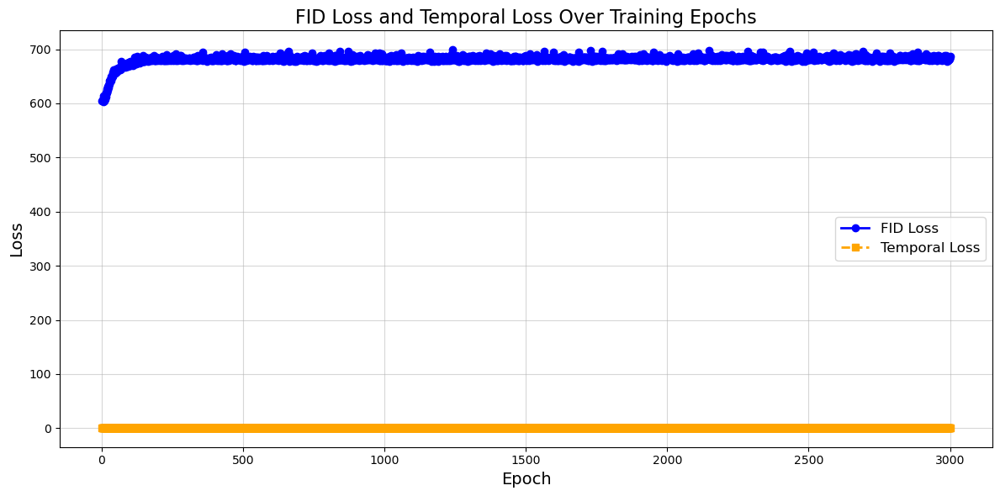

In [33]:
# Plot the losses using the train history
plot_losses(beatgan.train_hist)


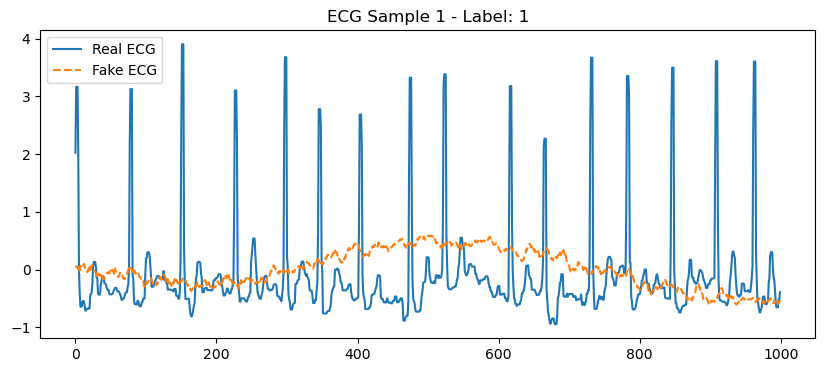

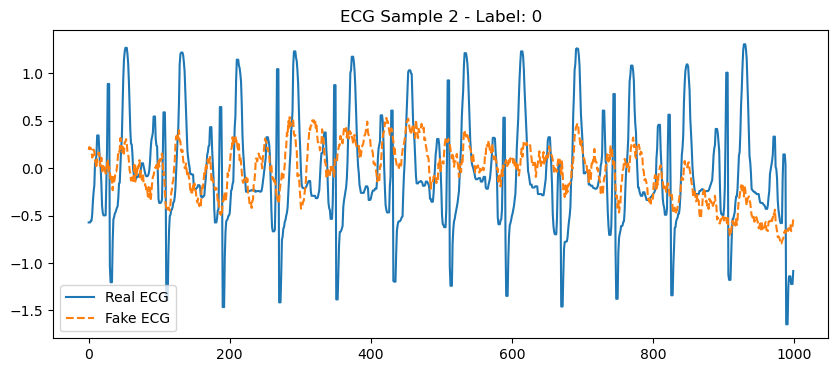

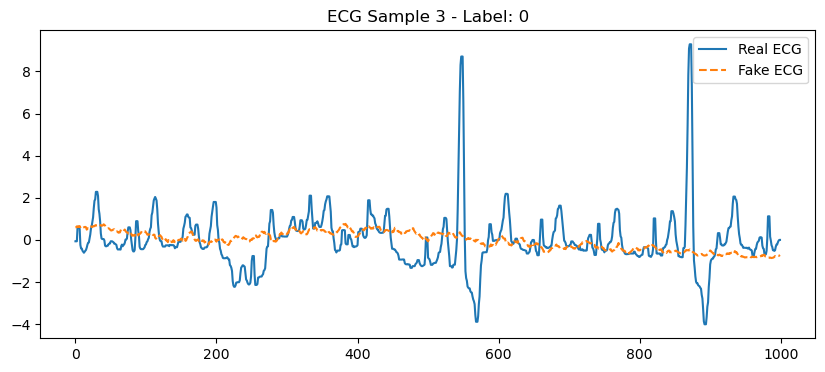

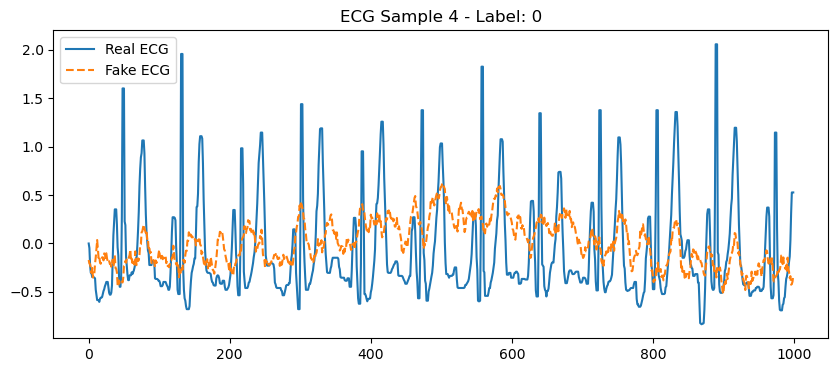

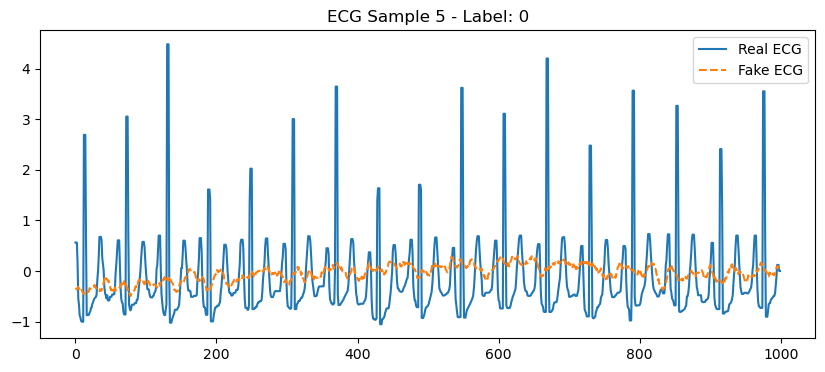

In [34]:
plot_fake_ecg_samples(beatgan.G, dataloaders["val"], device, num_samples=5)

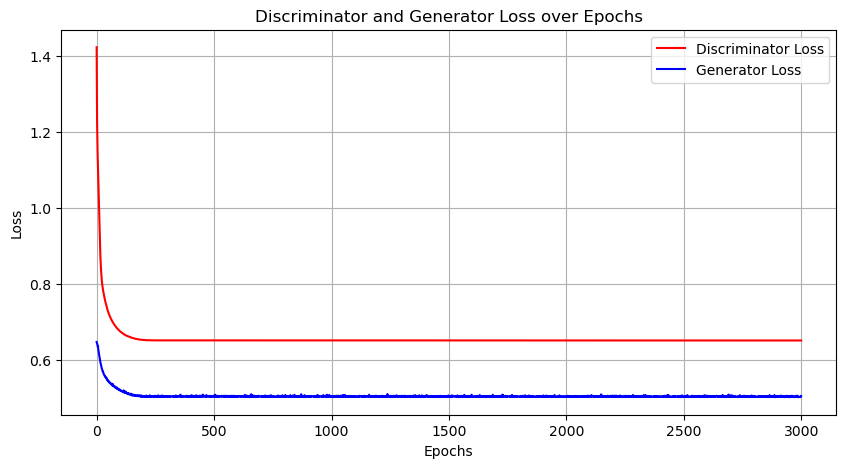

In [35]:
plot_loss(beatgan.train_hist)

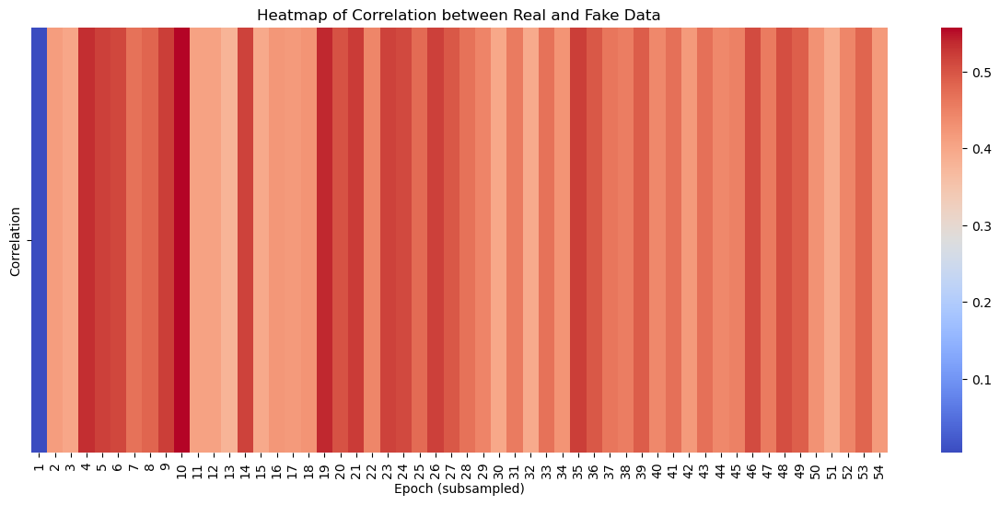

In [36]:
step = 2000 # Subsample every 100 epochs
sub_corr = beatgan.train_hist['correlations'][::step]
sub_real_means = beatgan.train_hist['real_means'][::step]
sub_fake_means = beatgan.train_hist['fake_means'][::step]
def plot_correlation_heatmap(correlation_values):
    """
    Plot a heatmap to visualize the evolution of correlations between real and fake data
    across epochs (subsampled for readability).
    """
    correlation_values = np.array(correlation_values).reshape(-1, 1)  # Reshape to 2D

    plt.figure(figsize=(15, 6))
    sns.heatmap(correlation_values.T, cmap="coolwarm", annot=False, 
                xticklabels=range(1, len(correlation_values) + 1), 
                yticklabels=["Correlation"])
    plt.xlabel("Epoch (subsampled)")
    plt.title("Heatmap of Correlation between Real and Fake Data")
    plt.show()
plot_correlation_heatmap(sub_corr)

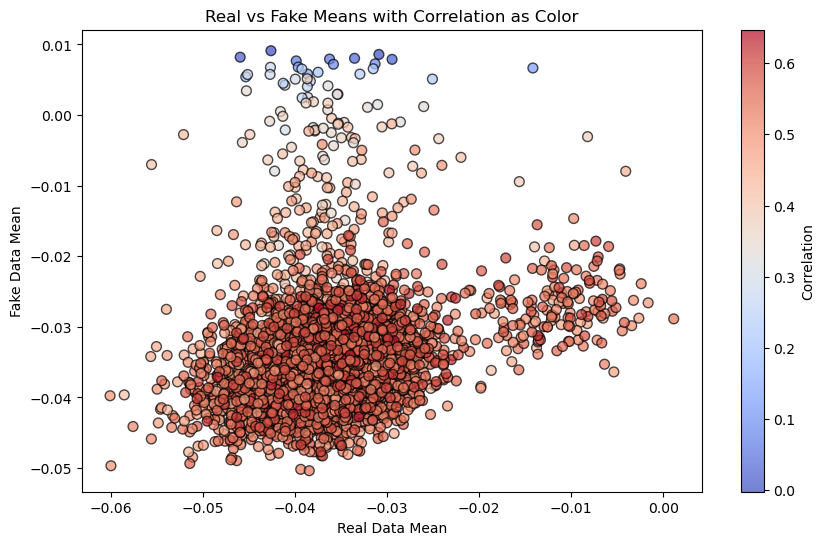

In [93]:

def plot_scatter_with_correlation(real_means, fake_means, correlations):
    """
    Scatter plot showing the relationship between real and fake means, 
    with color indicating the correlation for each epoch (subsampled for readability).
    """
    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(real_means, fake_means, c=correlations, cmap='coolwarm', 
                           s=50, edgecolor='black', alpha=0.7)
    plt.colorbar(scatter, label='Correlation')
    plt.xlabel("Real Data Mean")
    plt.ylabel("Fake Data Mean")
    plt.title("Real vs Fake Means with Correlation as Color")
    plt.show()
plot_scatter_with_correlation(sub_real_means, sub_fake_means, sub_corr)

In [ ]:
plot_correlation_heatmap(beatgan.train_hist['correlations'])
plot_scatter_with_correlation(
    beatgan.train_hist['real_means'], 
    beatgan.train_hist['fake_means'], 
    beatgan.train_hist['correlations'])

In [94]:
output_dir = '/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/fake_ecgs'


In [38]:


def generate_fake_ecgs(generator, dataloader, device, num_samples_label_0=650, num_samples_label_1=350, output_dir='./fake_ecgs'):
    """
    Generate fake ECG samples for two different classes and save them as files.
    
    Parameters:
    - generator: The trained Generator model.
    - dataloader: DataLoader for the validation or test set.
    - device: The device to run the model on (e.g., 'cuda' or 'cpu').
    - num_samples_label_0: Number of fake ECG samples with label 0 to generate.
    - num_samples_label_1: Number of fake ECG samples with label 1 to generate.
    - output_dir: Directory where the generated ECG samples will be saved.
    """
    # Ensure the output directory exists
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    generator.eval()  # Set the generator to evaluation mode

    # Initialize lists to store the generated ECGs and their corresponding labels
    fake_ecgs = []
    fake_labels = []

    # Generate samples for label 0
    for _ in range(num_samples_label_0):
        data_iter = iter(dataloader)
        real_data, real_labels = next(data_iter)

        # Generate fake ECGs with label 0
        fake_data = generator(real_data.to(device), torch.zeros_like(real_labels).to(device))
        fake_ecgs.append(fake_data.cpu().detach().numpy()[0])  # Store the fake ECG data
        fake_labels.append(0)  # Label 0

    # Generate samples for label 1
    for _ in range(num_samples_label_1):
        data_iter = iter(dataloader)
        real_data, real_labels = next(data_iter)

        # Generate fake ECGs with label 1
        fake_data = generator(real_data.to(device), torch.ones_like(real_labels).to(device))
        fake_ecgs.append(fake_data.cpu().detach().numpy()[0])  # Store the fake ECG data
        fake_labels.append(1)  # Label 1

    # Convert lists to numpy arrays
    fake_ecgs = np.array(fake_ecgs)
    fake_labels = np.array(fake_labels)

    # Save the generated ECGs and labels
    np.save(os.path.join(output_dir, 'fake_ecgs.npy'), fake_ecgs)
    np.save(os.path.join(output_dir, 'fake_labels.npy'), fake_labels)
    
    print(f"Generated {num_samples_label_0 + num_samples_label_1} fake ECG samples and saved to {output_dir}/")



In [39]:
generate_fake_ecgs(beatgan.G, dataloaders['test'], device)


Generated 1000 fake ECG samples and saved to ./fake_ecgs/


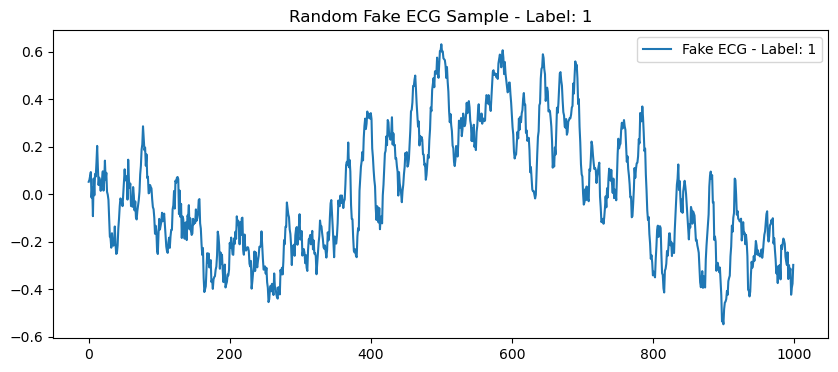

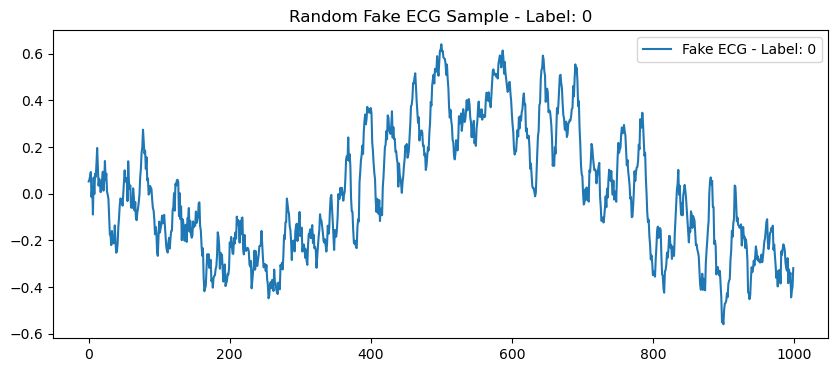

In [40]:


def plot_random_fake_ecgs(fake_ecgs, fake_labels, num_samples=2):
    """
    Plot random fake ECG samples.

    Parameters:
    - fake_ecgs: Array of generated fake ECG signals.
    - fake_labels: Corresponding labels for the fake ECGs (0 or 1).
    - num_samples: Number of random samples to plot.
    """
    #np.random.seed(None)
    # Randomly select indices for plotting
    indices = np.random.choice(len(fake_ecgs), num_samples, replace=False)

    # Plot the selected fake ECG samples
    for i in indices:
        plt.figure(figsize=(10, 4))
        
        # Get the fake ECG signal and its label
        fake_ecg = fake_ecgs[i].squeeze()  # Remove extra dimensions
        label = fake_labels[i]

        # Plot the fake ECG
        plt.plot(fake_ecg, label=f"Fake ECG - Label: {label}")
        plt.title(f"Random Fake ECG Sample - Label: {label}")
        plt.legend()
        plt.show()

# Load the fake ECGs and labels (assuming you've saved them previously)
fake_ecgs = np.load('/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/fake_ecgs/fake_ecgs.npy')
fake_labels = np.load('/home/arizmahm1/folder1/CGAN/PTBXL-AF-NORM Data/fake_ecgs/fake_labels.npy')

# Plot random fake ECG samples
plot_random_fake_ecgs(fake_ecgs, fake_labels, num_samples=2)


In [41]:
# Compute basic statistics for the fake ECGs based on label
fake_ecgs_label_0 = fake_ecgs[fake_labels == 0]
fake_ecgs_label_1 = fake_ecgs[fake_labels == 1]

# Print means and standard deviations for both labels
print("Label 0 - Mean:", np.mean(fake_ecgs_label_0), "Std:", np.std(fake_ecgs_label_0))
print("Label 1 - Mean:", np.mean(fake_ecgs_label_1), "Std:", np.std(fake_ecgs_label_1))


Label 0 - Mean: 0.0021837163 Std: 0.26960844
Label 1 - Mean: 0.0022152008 Std: 0.26251844
